# Cave Painting Preprocessing Comparison

This notebook lets you compare multiple preprocessing pipelines on different images.
You can modify preprocessing parameters and visualize the effects.


In [36]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

plt.rcParams["figure.figsize"] = (14, 10)


# Util fonction

def plot_side_by_side(titles, rgb, preprocessed, title=""):
    fig, axes = plt.subplots(1, 2)
    axes[0].imshow(rgb)
    axes[0].set_title(titles[0])
    axes[0].axis("off")

    axes[1].imshow(cv2.cvtColor(preprocessed, cv2.COLOR_LAB2RGB))
    axes[1].set_title(titles[1])
    axes[1].axis("off")

    plt.tight_layout()
    plt.title(title)
    plt.show()

## Preprocessing Functions

In [37]:

def convert_color_space(img, color_space):
    if color_space == "rgb":
        return img
    if color_space == "gray":
        return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if color_space == "hsv":
        return cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    if color_space == "lab":
        return cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    raise ValueError(color_space)


def equalize_image(img):
    if img.ndim == 2:
        return cv2.equalizeHist(img)
    ch = cv2.split(img)
    ch = [cv2.equalizeHist(c) for c in ch]
    return cv2.merge(ch)


def clahe_image(img, clip=2.0, grid=(8,8)):
    clahe = cv2.createCLAHE(clipLimit=clip, tileGridSize=grid)
    if img.ndim == 2:
        return clahe.apply(img)
    ch = cv2.split(img)
    ch = [clahe.apply(c) for c in ch]
    return cv2.merge(ch)


def decorrelation_stretch(img):
    if img.ndim != 3:
        return img
    X = img.astype(np.float32).reshape(-1,3)
    mean = X.mean(axis=0)
    Xc = X - mean
    cov = np.cov(Xc, rowvar=False)
    w, v = np.linalg.eigh(cov)
    W = v @ np.diag(1.0/np.sqrt(w+1e-5)) @ v.T
    Xw = Xc @ W.T
    Xw -= Xw.min()
    Xw /= Xw.max()
    Xw *= 255
    return Xw.reshape(img.shape).astype(np.uint8)


def denoise(img, method=None, g_sigma=1.0, m_ksize=2):
    if method is None:
        return img
    if method == "gaussian":
        k = int(g_sigma*6+1)|1
        return cv2.GaussianBlur(img,(k,k),g_sigma)
    if method == "median":
        if m_ksize % 2 == 0:
            m_ksize += 1
        return cv2.medianBlur(img, m_ksize)
    raise ValueError(method)


def preprocess(img,
               color_space,
               contrast=None,
               noise=None,
               decorrelate=False):
    if color_space!=None:
        out = convert_color_space(img, color_space)
    else: 
        out=img
    
    if decorrelate:
        out = decorrelation_stretch(out)
    
    if contrast == "equalize":
        out = equalize_image(out)
    elif contrast == "clahe":
        out = clahe_image(out)
        
    out = denoise(out, noise)
    return out


## Loading the images

- charcoal : panel of the rhinos (Chauvet), panel of the lions (Chauvet)
- red paint : red dots cluster (Chauvet)
- red paint and charcoal : Lascaux 015, Lascaux 017, Lascaux 008, Gargas, Cueva de las manos

In [ ]:
paths = [
    Path("../dataset/chauvet/panel-of-the-rhinos-chauvet-cave-replica-6350.jpg"),
    Path("../dataset/chauvet/panel-of-the-lions-detail-chauvet-cave-6345.jpg"),
    Path("../dataset/chauvet/red-dots-cluster-chauvet-cave-replica-6347.jpg"),
    Path("../dataset/lascaux/Lascaux_015.jpg"),
    Path("../dataset/lascaux/Lascaux_017.jpg"),
    Path("../dataset/lascaux/Lascaux_008.jpg"),
    Path("../dataset/mains/Gargas_-_Grande_Paroi_-_Panneau_6.jpg"),
    Path("../dataset/mains/Cueva_de_las_manos_-_detalle.jpg")
]

images = []
for p in paths:
    print(p)
    bgr = cv2.imread(str(p))
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    images.append((p.name, rgb))

dataset\chauvet\panel-of-the-rhinos-chauvet-cave-replica-6350.jpg
dataset\chauvet\panel-of-the-lions-detail-chauvet-cave-6345.jpg
dataset\chauvet\red-dots-cluster-chauvet-cave-replica-6347.jpg
dataset\lascaux\Lascaux_015.jpg
dataset\lascaux\Lascaux_017.jpg
dataset\lascaux\Lascaux_008.jpg
dataset\mains\Gargas_-_Grande_Paroi_-_Panneau_6.jpg
dataset\mains\Cueva_de_las_manos_-_detalle.jpg


## Visualization Grid

A visualization grid is created to compare the preprocessig combinations for the images chosen above.

In [39]:
import itertools
import matplotlib.pyplot as plt

COLOR_SPACES = ["rgb", "lab", "hsv", "gray"]
CONTRASTS = [None, "equalize", "clahe"]
NOISES = [None, "gaussian", "median"]

combos = list(itertools.product(CONTRASTS, NOISES))

In [40]:
def show_preproc_table(images):
    for name, img in images:
        
        n_rows = len(COLOR_SPACES)
        n_cols = len(combos)
        
        fig, axes = plt.subplots(
            n_rows, n_cols,
            figsize=(3*n_cols, 3*n_rows)
        )
        
        fig.suptitle(name, fontsize=16)
        
        for r, cs in enumerate(COLOR_SPACES):
            for c, (contrast, noise) in enumerate(combos):
                
                cfg = dict(color_space=cs)
                if contrast:
                    cfg["contrast"] = contrast
                if noise:
                    cfg["noise"] = noise
                
                try:
                    out = preprocess(img, **cfg)
                except Exception as e:
                    ax.text(0.5, 0.5, "ERR", ha="center", va="center")
                    ax.axis("off")
                    continue
                
                ax = axes[r, c]
                
                if out.ndim == 2:
                    ax.imshow(out, cmap="gray")
                else:
                    ax.imshow(out)
                
                if r == 0:
                    ax.set_title(f"{contrast or 'none'}\n{noise or 'no-noise'}")
                
                if c == 0:
                    ax.set_ylabel(cs, rotation=90, size=12)
                
                ax.axis("off")
        
        plt.tight_layout()
        plt.show()

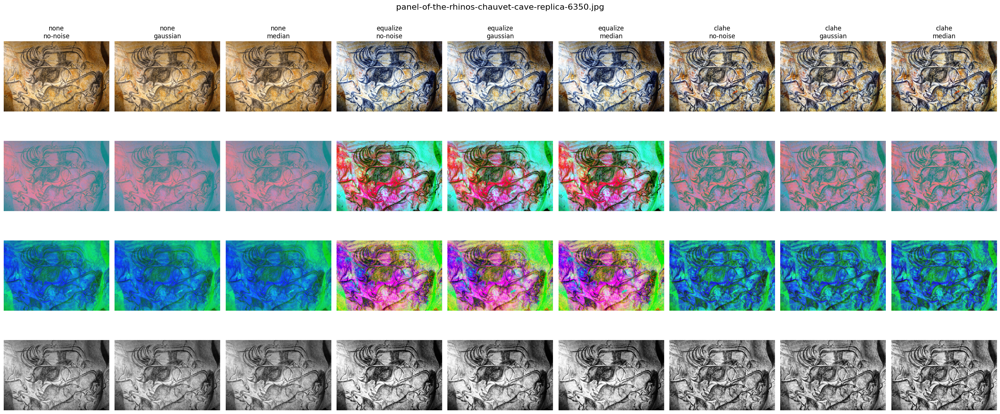

In [41]:
# Show only the first image
show_preproc_table([images[0]])

Seeing the above visuals concerning the blurring and histogram equalization techniques, the following preprocessing is chosen, for all segmentation methods that will later be implemented:
- Transformation to a coherent color space (RGB, L\*a\*b\*, HSV) depending of the algorithm,
- CLAHE (Contrast Limited Adaptive Histogram Equalization) to improve the images contrast,
- median blur to smooth the images using a median filter with a k_size×k_size aperture.


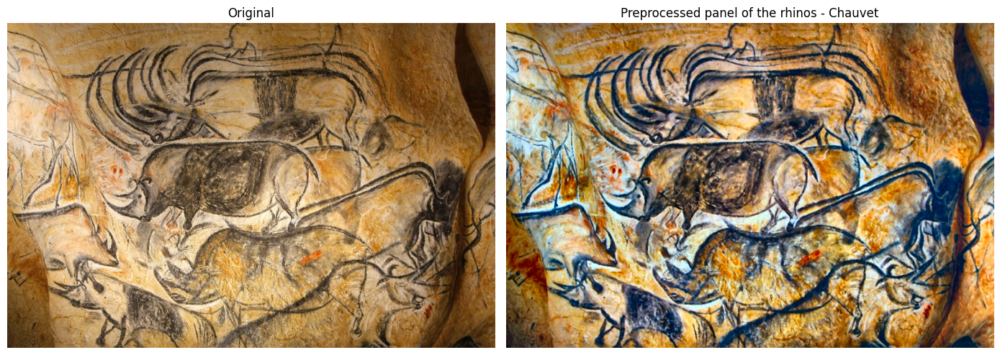

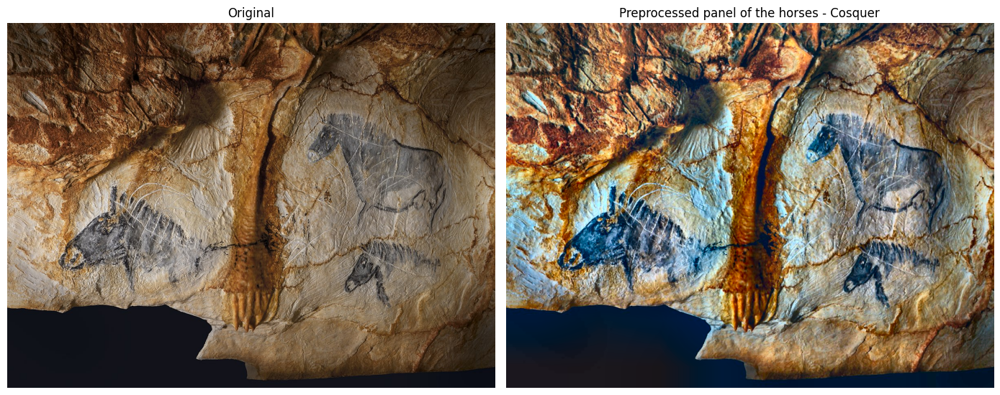

In [42]:
# Preprocessing visualization

## Panel of the rhinos (Chauvet, France)
bgr = cv2.imread("dataset\chauvet\panel-of-the-rhinos-chauvet-cave-replica-6350.jpg")
rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

preprocessed = preprocess(rgb, "lab", contrast= "clahe", noise="median")

titles = ["Original", "Preprocessed"]

plot_side_by_side(titles, rgb, preprocessed, title="Preprocessed panel of the rhinos - Chauvet")


# Pannel of the horses (Cosquer, France)
bgr = cv2.imread("dataset\cosquer\Panneau_des_chevaux_-_Cosquer_Mediterranee.jpg")
rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

preprocessed = preprocess(rgb, "lab", contrast= "clahe", noise="median")

titles = ["Original", "Preprocessed"]

plot_side_by_side(titles, rgb, preprocessed, title="Preprocessed panel of the horses - Cosquer")


As explained in the article, a feature is added permitting to crop the image to keep only the wanted painting. The final preprocessing function is therfore written below (crop + convert to color space + clahe + median blur).

The x1,y1,x2,y2 are the bounding box coordinates obtained with the dedicated function.

In [43]:
def crop_and_preprocess_img(img_path, x1,y1,x2,y2, color_space="lab"):
    cropped_img = crop_image(img_path, x1,y1,x2,y2)
    preprocessed_img = preprocess_image(cropped_img, color_space)
    return preprocessed_img

def crop_image(img_path, x1,y1,x2,y2):
    img_bgr = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    cropped_img = img_rgb[y1:y2, x1:x2]
    return cropped_img

def preprocess_image(img, color_space="lab"):
    """ img must be RGB"""
    out = convert_color_space(img, color_space)
    out = clahe_image(out)
    out = denoise(out, "median", m_ksize=2)
    return out

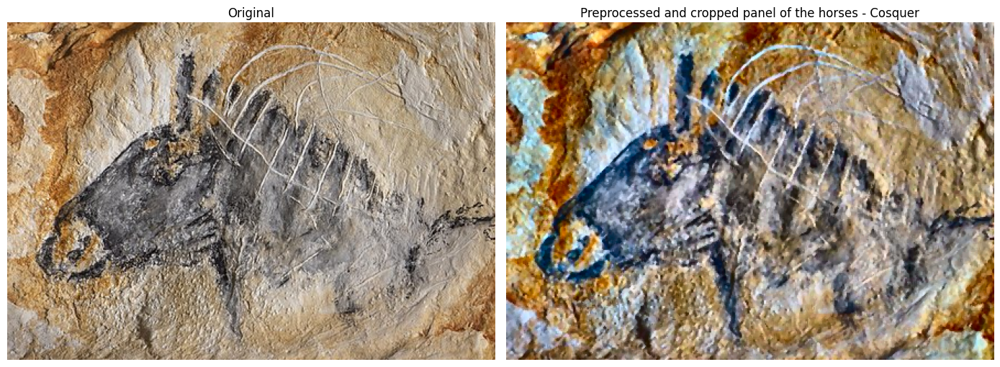

In [47]:
rgb_cropped = crop_image("dataset\cosquer\Panneau_des_chevaux_-_Cosquer_Mediterranee.jpg", 100, 375, 543, 682)

preprocessed_rgb = crop_and_preprocess_img("dataset/cosquer/Panneau_des_chevaux_-_Cosquer_Mediterranee.jpg", 100, 375, 543, 682, "lab")

titles = ["Original", "Preprocessed"]

plot_side_by_side(titles, rgb_cropped, preprocessed_rgb, title="Preprocessed and cropped panel of the horses - Cosquer")